In [1]:
import pandas as pd
import numpy as np

## Problem 1

In [ ]:
with open('dataset/acm.v9/acm.txt', 'r', encoding='utf-8') as file:
    # Parse the data by prefix into a list of dict
    records = []
    
    for block in file.read().split('\n\n'):
        record = {
            'title': '',
            'authors': [],
            'year': '',
            'journal': '',
            'index': '',
            'citations': []
        }
        for line in block.strip().split('\n'):
            if line.startswith('#*'):
                record['title'] = line.replace('#*', '').strip()
            elif line.startswith('#@'):
                record['authors'] = [author.strip() for author in line.replace('#@', '').split(',')]
            elif line.startswith('#t'):
                record['year'] = line.replace('#t', '').strip()
            elif line.startswith('#c'):
                record['journal'] = line.replace('#c', '').strip()
            elif line.startswith('#index'):
                record['index'] = line.replace('#index', '').strip()
            elif line.startswith('#%'):
                record['citations'].append(line.replace('#%', '').strip())
        records.append(record)

# Convert the list of dictionaries to a DataFrame
df = pd.DataFrame(records)

df.head()   

In [3]:
authors = df['authors'].explode().unique()
journals = df['journal'].unique()
citations = df['citations'].explode().unique()
print('Number of authors: ', len(authors))
print('Number of publication venues: ', len(journals))
print('Number of citations: ', len(citations))

Number of authors:  1651590
Number of publication venues:  273330
Number of citations:  1007496


In [184]:
# B
for x in journals:
    if 'Principles and Practice of Knowledge Discovery in Databases' in x:
        print(x)

PKDD '04 Proceedings of the 8th European Conference on Principles and Practice of Knowledge Discovery in Databases
Knowledge Discovery in Databases: PKDD 2006: 10th European Conference on Principles and Practice of Knowledge Discovery in Databases, Berlin, Germany, September ... (Lecture Notes in Computer Science)
Knowledge Discovery in Databases: PKDD 2005: 9th European Conference on Principles and Practice of Knowledge Discovery in Databases, Porto, Portugal, October ... / Lecture Notes in Artificial Intelligence)
PKDD 2007 Proceedings of the 11th European conference on Principles and Practice of Knowledge Discovery in Databases
PKDD'05 Proceedings of the 9th European conference on Principles and Practice of Knowledge Discovery in Databases


Some publication venues are recorded by different names in different years, but they actually refer to the same conference.

In [7]:
# C
import matplotlib.pyplot as plt

author_publications = {}
for _, row in df.iterrows():
    for author in row['authors']:
        if author not in author_publications:
            author_publications[author] = []
        author_publications[author].append(row['title'])

# Calculate the number of publications per author
author_pub_counts = [len(pubs) for pubs in author_publications.values()]

In [12]:
sorted(author_publications.items(),key=lambda x: len(x[1]), reverse=True)

[('Jr.',
  ['Up and running: the small business computer implementation cookbook',
   'The data center disaster consultant',
   'Systems, Objectives, Solutions',
   'Insertion and compaction algorithms in sequentially allocated storage',
   'A methodology and notation for compiler front end design',
   'An acceptance-complement analogue of the mixture-plus-acceptance-rejection method for generating random variables',
   'Optimum Head Separation in a Disk System with Two Read/Write Heads',
   'An O(n log n) Manhattan path algorithm',
   'Considerations in a distributed environment',
   'Videotex—a consumer information utility',
   'Incomplete Information in Relational Databases',
   'Computing in Medicine',
   'A performance guarantee for the greedy set-partitioning algorithm',
   'My personal computer and other family crises',
   'Dynamic, first-fit packings in two or more dimensions',
   'The RISC II micro-architecture',
   'The analysis of algorithms',
   'Human factors in software e

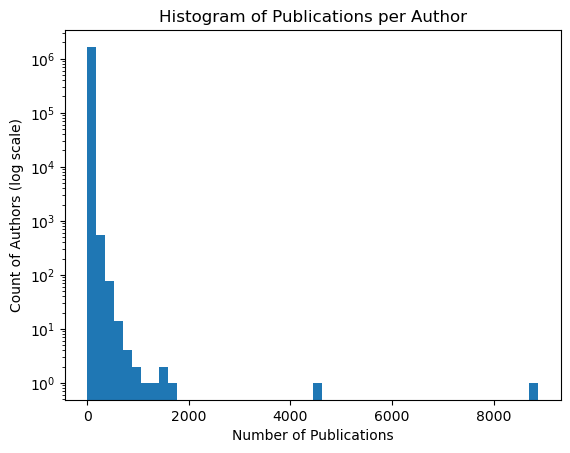

In [96]:
# Plot histogram
plt.hist(author_pub_counts, bins=50, log=True)
#plt.ticklabel_format(style='plain', axis='x')
plt.xlabel('Number of Publications')
plt.ylabel('Count of Authors (log scale)')
plt.title('Histogram of Publications per Author')
plt.show()

In [186]:
# D
pd.Series(author_pub_counts).describe()

count    1.651589e+06
mean     3.462632e+00
std      1.277265e+01
min      1.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      3.000000e+00
max      8.878000e+03
dtype: float64

### Compare the median to the mean and explain the difference between the two values based on the standard deviation and the 1st and 3rd quartiles.
More than half of the authors have only 1 publication, the mean is about 3.4 because the there is a quarter of the authors have more than 3 publications and some of them have hundreds of publications.   

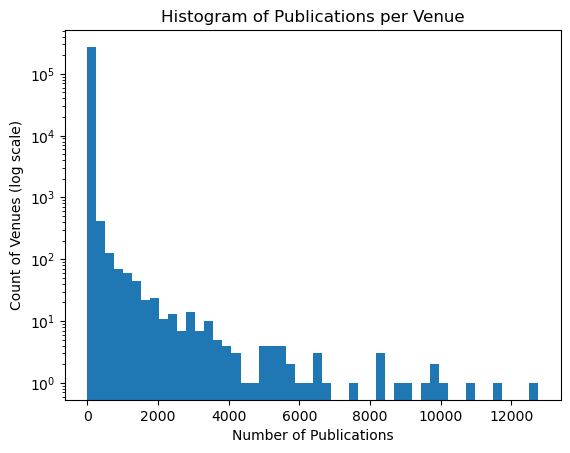

In [187]:
#E
venue_pub_counts = df['journal'].value_counts()

plt.hist(venue_pub_counts, bins=50, log=True)
plt.xlabel('Number of Publications')
plt.ylabel('Count of Venues (log scale)')
plt.title('Histogram of Publications per Venue')
plt.show()

In [208]:
venue_pub_counts

journal
IEEE Transactions on Information Theory                                                                                  12754
Computer                                                                                                                 11621
Discrete Mathematics                                                                                                     10814
Communications of the ACM                                                                                                10125
IEEE Transactions on Signal Processing                                                                                    9863
                                                                                                                         ...  
Boundedness of Automorphic L-Functions in Vertical Strips                                                                    1
Numerical Criterion for the Stabilization of Steady States of the Navier-Stokes Equations              

IEEE Transactions on Information Theory has the highest number of publications.

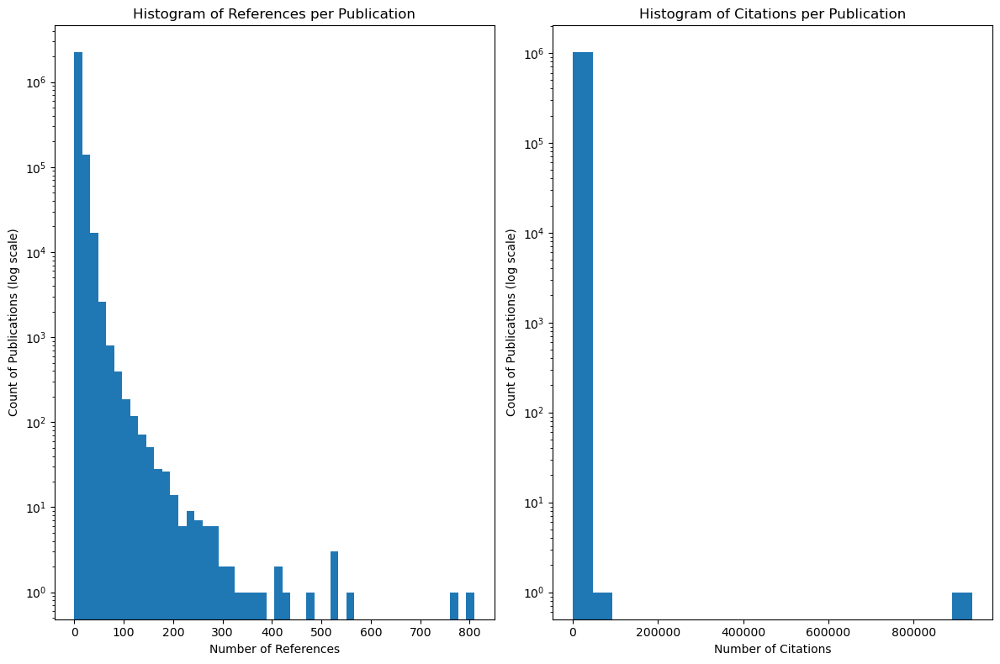

Publication with the largest number of references: ACM SIGOPS 24th Symposium on Operating Systems Principles (809 references)
Publication with the largest number of citations: IEEE Transactions on Software Engineering (938039 citations)


In [97]:
#F 

# Calculate the number of references and citations per publication
publication_references = df['citations'].apply(len)
publication_citations = df['citations'].explode().value_counts()

# Plot histograms
plt.figure(figsize=(12, 8))

plt.subplot(1, 2, 1)
plt.hist(publication_references, bins=50, log=True)
plt.xlabel('Number of References')
plt.ylabel('Count of Publications (log scale)')
plt.title('Histogram of References per Publication')

plt.subplot(1, 2, 2)
plt.hist(publication_citations, bins=20, log=True)
plt.xlabel('Number of Citations')
plt.ylabel('Count of Publications (log scale)')
plt.title('Histogram of Citations per Publication')

plt.tight_layout()
plt.show()

# Find the publication with the largest number of references and citations
max_references = publication_references.max()
max_citations = publication_citations.max()
publication_with_max_references = df.loc[int(publication_references.idxmax()), 'journal']
publication_with_max_citations = df.loc[int(publication_citations.idxmax()), 'journal']

print(f"Publication with the largest number of references: {publication_with_max_references} ({max_references} references)")
print(f"Publication with the largest number of citations: {publication_with_max_citations} ({max_citations} citations)")

In [18]:
df[df['journal']=='IEEE Transactions on Software Engineering']['citations'].explode().value_counts().sum()

26960

In [19]:
len(df[df['journal']=='IEEE Transactions on Software Engineering']['citations'].explode().unique())

14088

In [20]:
len(df[df['journal']=='IEEE Transactions on Software Engineering']['citations'].explode())

29245

In [26]:
df[df['journal']=='IEEE Transactions on Software Engineering'].groupby('journal')['citations'].apply(lambda x: len(x.explode().unique()) / len(x))

journal
IEEE Transactions on Software Engineering    3.643134
Name: citations, dtype: float64

In [13]:
def test(x):
    print(len(x))
    all_c = len(x.explode())
    print(all_c)
    return all_c/len(x)

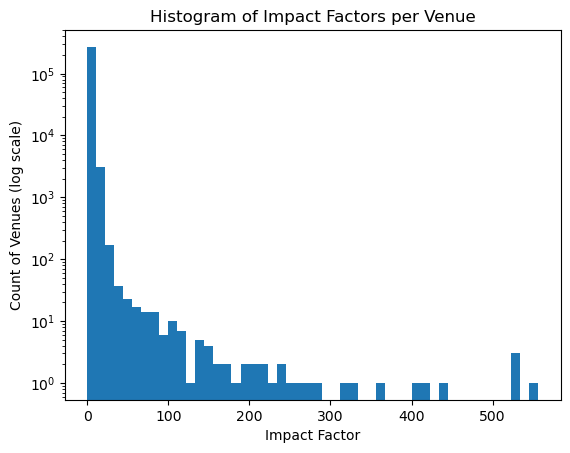

In [28]:
venue_impact_factors2 = df.groupby('journal')['citations'].apply(lambda x: len(x.explode().unique()) / len(x))

# Plot histogram of impact factors
plt.hist(venue_impact_factors2, bins=50, log=True)
plt.xlabel('Impact Factor')
plt.ylabel('Count of Venues (log scale)')
plt.title('Histogram of Impact Factors per Venue')
plt.show()

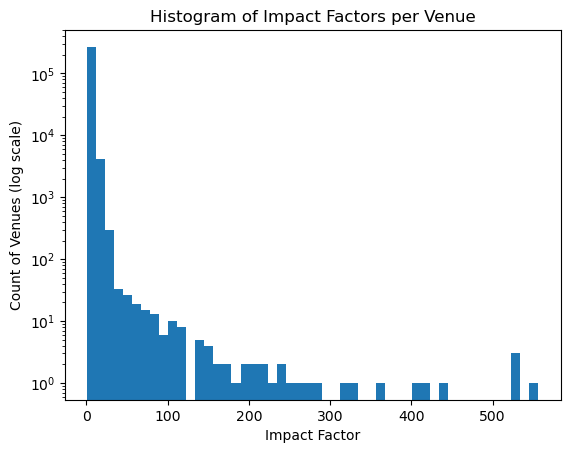

In [27]:
#G
import matplotlib.pyplot as plt
# Calculate the impact factor for each venue (citations/publications of the venue)
venue_impact_factors = df.groupby('journal')['citations'].apply(lambda x: len(x.explode()) / len(x))

# Plot histogram of impact factors
plt.hist(venue_impact_factors, bins=50, log=True)
plt.xlabel('Impact Factor')
plt.ylabel('Count of Venues (log scale)')
plt.title('Histogram of Impact Factors per Venue')
plt.show()

In [30]:
#H
# Venue with the highest impact factor
max_impact_factor = venue_impact_factors.max()
venue_with_max_impact_factor = venue_impact_factors.idxmax()

print(f"Venue with the highest impact factor: {venue_with_max_impact_factor} ({max_impact_factor})")

Venue with the highest impact factor: System-on-Chip Test Architectures: Nanometer Design for Testability (556.0)


In [212]:
venue_impact_factors.sort_values(axis=0, ascending=False)

journal
System-on-Chip Test Architectures: Nanometer Design for Testability                           556.0
Human-centered visualization environments                                                     528.0
Algorithms for memory hierarchies: advanced lectures                                          525.0
Reconfigurable Computing: The Theory and Practice of FPGA-Based Computation                   524.0
Algorithm engineering: bridging the gap between algorithm theory and practice                 436.0
                                                                                              ...  
Evolutionary design of controlled structures                                                    0.0
Evolutionary development of an interactive scheduling system for a generalized flowshop         0.0
Evolutionary dynamics on complex networks                                                       0.0
Evolutionary fabrication: the co-evolution of form and formation                            

In [209]:
df[df['journal'] == 'System-on-Chip Test Architectures: Nanometer Design for Testability']

,title,authors,year,journal,index,citations
1221202,System-on-Chip Test Architectures: Nanometer D...,[Wang],2007,System-on-Chip Test Architectures: Nanometer D...,1221203,"[1365, 4185, 20375, 27799, 29136, 32250, 55297..."


This seems to be a conference with a very high impact factor, but it has only one publication. This is likely an outlier.

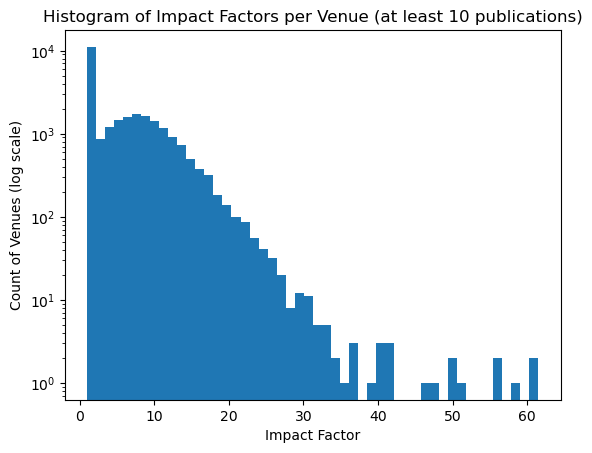

Venue with the highest impact factor (filtered): Foundations and Trends in Information Retrieval (61.47826086956522)
Citation counts for all publications from this venue: [50, 53, 30, 55, 160, 96, 210, 150, 98, 34, 82, 194, 162, 219, 184, 158, 134, 0, 0, 0, 91, 123, 171, 141, 101, 0, 0, 0, 0, 0, 109, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Mean number of citations: 60.97826086956522
Median number of citations: 15.0


In [29]:
#I
# Filter venues with at least 10 publications
filtered_venue_impact_factors = venue_impact_factors[df['journal'].value_counts() >= 10]

# Plot histogram of filtered impact factors
plt.hist(filtered_venue_impact_factors, bins=50, log=True)
plt.xlabel('Impact Factor')
plt.ylabel('Count of Venues (log scale)')
plt.title('Histogram of Impact Factors per Venue (at least 10 publications)')
plt.show()

# Venue with the highest impact factor among filtered venues
max_filtered_impact_factor = filtered_venue_impact_factors.max()
venue_with_max_filtered_impact_factor = filtered_venue_impact_factors.idxmax()

# List citation counts for all publications from the venue with the highest impact factor
citation_counts = df[df['journal'] == venue_with_max_filtered_impact_factor]['citations'].apply(len)

print(f"Venue with the highest impact factor (filtered): {venue_with_max_filtered_impact_factor} ({max_filtered_impact_factor})")
print(f"Citation counts for all publications from this venue: {citation_counts.tolist()}")
print(f"Mean number of citations: {citation_counts.mean()}")
print(f"Median number of citations: {citation_counts.median()}")

Impact factor outliers which are larger than 100 are filtered out.

In [215]:
filtered_venue_impact_factors.sort_values(axis=0, ascending=False)

journal
A 25-year perspective on logic programming                                                                                        54.642857
Proceedings of the on Future of Software Engineering                                                                              53.687500
Foundations and Trends in Information Retrieval                                                                                   53.065217
Distributed Computing - Papers in celebration of the 20th anniversary of PODC                                                     53.000000
Foundations and Trends in Databases                                                                                               52.538462
                                                                                                                                    ...    
DISCO '90 Proceedings of the International Symposium on Design and Implementation of Symbolic Computation Systems                  0.000000
DISC '98 Pro

In [34]:
publication_years.value_counts()
    

TypeError: unhashable type: 'list'

In [ ]:
#J
# Construct a list of publications for each publication year
publication_years = df.groupby('year')

# Calculate average number of references and citations per publication for each year
avg_references_per_year = publication_years['citations'].apply(lambda x: x.value_counts().mean())
avg_citations_per_year = publication_years['citations'].apply(lambda x: len(x)).mean()

# Plot the trends
plt.figure(figsize=(20, 10))

plt.plot(avg_references_per_year.index, avg_references_per_year, label='Average References per Publication')
plt.plot(avg_citations_per_year.index, avg_citations_per_year, label='Average Citations per Publication')
plt.xlabel('Year')
plt.ylabel('Average Count')
plt.title('Average Number of References and Citations per Publication Over Time')
plt.legend()
plt.show()

In [13]:
df['year'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2385067 entries, 0 to 2385066
Series name: year
Non-Null Count    Dtype 
--------------    ----- 
2385067 non-null  object
dtypes: object(1)
memory usage: 18.2+ MB


In [ ]:
df[df['year'] == '2009']#[')citations']#.apply(lambda x: x.value_counts().mean())

In [ ]:
df['year'].head()#value_counts()

Both average references and citations per publication have been increasing over time. Year 2016 drops significantly, this might be due to data collection happened in the middle of 2016.

In [79]:
#df.to_csv('dataset/acm.v9/acm.csv', sep='\t', index=False)
#df = pd.read_csv('dataset/acm.v9/acm.csv',sep='\t')
df.head()

,title,authors,year,journal,index,citations
0,MOSFET table look-up models for circuit simula...,[],1984.0,"Integration, the VLSI Journal",1.0,[]
1,The verification of the protection mechanisms ...,['Virgil D. Gligor'],1984.0,International Journal of Parallel Programming,2.0,[]
2,Another view of functional and multivalued dep...,"['M. Gyssens', 'J. Paredaens']",1984.0,International Journal of Parallel Programming,3.0,[]
3,Entity-relationship diagrams which are in BCNF,"['Sushil Jajodia', 'Peter A. Ng', 'Frederick N...",1984.0,International Journal of Parallel Programming,4.0,[]
4,The computer comes of age,['Rene Moreau'],1984.0,The computer comes of age,5.0,[]


## Problem 2

In [80]:
# A
def convert2arff(input_file, output_file):
    unique_sites = set()
    with open(input_file, 'r') as file:
        for line in file:
            sites = set(line.strip().split(' '))
            unique_sites.update(sites)
        
        unique_sites = sorted([int(site) for site in unique_sites])
        item_to_index = {item: idx for idx, item in enumerate(unique_sites)}    
        
        #write @attributs
        with open(output_file, 'w') as arff:
            arff.write('@relation kosarak\n')
            for site in unique_sites:
                arff.write('@attribute ' + str(site) + ' {0, 1}\n')
            
            #write @data
            arff.write('\n@data\n')
            with open(input_file, 'r') as file:
                for line in file:
                    transactions = set(line.strip().split()) # remove duplicate sites
                    transactions = sorted([int(transaction) for transaction in transactions])
                                       
                    transactions = [
                        f"{item_to_index[transaction]} 1" 
                        for transaction in transactions
                    ]
                    sparse_line = "{" + ", ".join(transactions) + "}"
                    arff.write(sparse_line + "\n")
                
    

In [81]:
%%time
#B
convert2arff('dataset/kosarak.dat', 'dataset/kosarak.arff')


CPU times: total: 14.6 s
Wall time: 22.6 s


# C
Took about 50 sec to open the .arff file in Weka

# D

# E 
17:26:55: Started weka.associations.FPGrowth
17:26:55: Command: weka.associations.FPGrowth -P 2 -I -1 -N 10 -T 0 -C 0.99 -D 0.05 -U 1.0 -M 49500.0
17:26:58: Finished weka.associations.FPGrowth
17:27:57: Started weka.associations.FPGrowth
17:27:57: Command: weka.associations.FPGrowth -P 2 -I -1 -N 10 -T 0 -C 0.99 -D 0.05 -U 1.0 -M 49500.0
17:28:00: Finished weka.associations.FPGrowth
17:28:03: Started weka.associations.FPGrowth
17:28:03: Command: weka.associations.FPGrowth -P 2 -I -1 -N 10 -T 0 -C 0.99 -D 0.05 -U 1.0 -M 49500.0
17:28:05: Finished weka.associations.FPGrowth
17:28:11: Started weka.associations.FPGrowth
17:28:11: Command: weka.associations.FPGrowth -P 2 -I -1 -N 10 -T 0 -C 0.99 -D 0.05 -U 1.0 -M 49500.0
17:28:13: Finished weka.associations.FPGrowth
17:28:15: Started weka.associations.FPGrowth
17:28:15: Command: weka.associations.FPGrowth -P 2 -I -1 -N 10 -T 0 -C 0.99 -D 0.05 -U 1.0 -M 49500.0
17:28:19: Finished weka.associations.FPGrowth

the fpgrowth step took less time than loading and converting the data.

## Problem 3

### MNIST dataset

In [98]:
from keras.datasets import mnist


In [99]:
(train_X, train_y), (test_X, test_y) = mnist.load_data()

In [100]:
train_X.shape

(60000, 28, 28)

In [101]:
def normalization_images(X):
    normalized_images = []
    standardized_images = []
    X = X.reshape(X.shape[0], X.shape[1]*X.shape[2])
    for image in X:
        normalized_images.append((image - np.min(image))/np.max(image))
        standardized_images.append((image - np.mean(image))/np.std(image))
    return np.array(normalized_images), np.array(standardized_images)

In [102]:
normalized_train_X, standardized_train_X = normalization_images(train_X)

In [103]:
normalized_train_X[:5]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [31]:
from sklearn.metrics import pairwise_distances
#dist_matrix_lib = pairwise_distances(normalized_train_X.astype(np.float16), metric='euclidean') #memory issue

In [10]:
def custom_pairwise_distances(X, Y=None, metric='euclidean'):
    if Y is None:
        Y = X
    if metric == 'euclidean':
        dists = np.sqrt(np.sum((X[:, np.newaxis, :] - Y[np.newaxis, :, :]) ** 2, axis=-1)) # use np.newaxis to increase dimension 
    elif metric == 'manhattan':
        dists = np.sum(np.abs(X[:, np.newaxis, :] - Y[np.newaxis, :, :]), axis=-1)
    else:
        raise ValueError(f"Unsupported metric: {metric}")
    return dists

In [104]:
def batchwise_pairwise_distances(X, batch_size=1000, metric='euclidean'):
    """
    Compute the NxN distance matrix for X in row-chunks.
    Returns an (N, N) numpy array.
    """
    N = X.shape[0]
    dist_matrix = np.zeros((N, N), dtype=np.float16)  

    for start_idx in range(0, N, batch_size):
        end_idx = min(start_idx + batch_size, N)
        X_batch = X[start_idx:end_idx]

        # shape: (batch_size, N)
        dist_block = pairwise_distances(X_batch, X, metric=metric)
        dist_matrix[start_idx:end_idx, :] = dist_block

    return dist_matrix

dist_matrix = batchwise_pairwise_distances(normalized_train_X.astype(np.float16), batch_size=1000, metric='euclidean') # use float16 to save memory

In [17]:
dist_matrix.shape

(60000, 60000)

In [105]:
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import TfidfVectorizer

# Load 20 Newsgroups dataset
train_data = fetch_20newsgroups(subset='train', shuffle=True, random_state=17)
test_data = fetch_20newsgroups(subset='test', shuffle=True, random_state=17)

# Apply TF normalization
vectorizer = TfidfVectorizer()
train_documents_tfidf = vectorizer.fit_transform(train_data.data)
test_documents_tfidf = vectorizer.transform(test_data.data)

# Compute pairwise Euclidean distances
euclidean_distances_20ng = pairwise_distances(train_documents_tfidf, metric='euclidean')

# Compute cosine similarity
from sklearn.metrics.pairwise import cosine_similarity
cosine_similarity_20ng = cosine_similarity(train_documents_tfidf)

In [32]:
euclidean_distances_20ng.shape

(11314, 11314)

In [33]:
euclidean_distances_20ng.shape

(11314, 11314)

## Problem 4 Train and test KNN classification

In [106]:
import numpy as np
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.metrics import pairwise_distances
from collections import Counter

class KNNClassifier(BaseEstimator, ClassifierMixin):
    def __init__(self, n_neighbors=5, distance_metric='euclidean', batch_size=1000):
        self.n_neighbors = n_neighbors
        self.distance_metric = distance_metric
        self.batch_size = batch_size

    def fit(self, X, y):
        self.X_train = np.array(X)
        self.y_train = np.array(y)
        return self

    def _compute_distance_batch(self, X):
        n_test = X.shape[0]
        n_train = self.X_train.shape[0]
    
        distances = np.zeros((n_test, n_train), dtype=np.float16)
    
        for i in range(0, n_test, self.batch_size):
            end_idx = min(i + self.batch_size, n_test)
            batch_distances = pairwise_distances(
                X[i:end_idx],
                self.X_train,
                metric=self.distance_metric
            )
            distances[i:end_idx] = batch_distances
        return distances

    def predict(self, X):
        distances = self._compute_distance_batch(X)
        neighbors = np.argsort(distances, axis=1)[:, :self.n_neighbors]
        y_neighbors = self.y_train[neighbors]
        predictions = np.array(
            [Counter(neighbors).most_common(1)[0][0] for neighbors in y_neighbors]
        )
        return predictions

    def score(self, X, y):
        predictions = self.predict(X)
        return np.mean(predictions == y)

In [50]:
knn = KNNClassifier(n_neighbors=5)
knn.fit(train_documents_tfidf, train_data.target)

train_score = knn.score(train_documents_tfidf, train_data.target)
test_score = knn.score(test_documents_tfidf, test_data.target)

print(f"20 Newsgroups Training Accuracy: {train_score}")
print(f"20 Newsgroups Testing Accuracy: {test_score}")

20 Newsgroups Training Accuracy: 0.9165635495845855
20 Newsgroups Testing Accuracy: 0.6755177907594264


In [77]:
knn = KNNClassifier(n_neighbors=5)
knn.fit(normalized_train_X, train_y)
normalized_test_X, _ = normalization_images(test_X)

train_score = knn.score(normalized_train_X.astype(np.float16)[:10000], train_y[:10000])
test_score = knn.score(normalized_test_X.astype(np.float16), test_y)

print(f"MNIST Training Accuracy: {train_score}")
print(f"MNIST Testing Accuracy: {test_score}")

MNIST Training Accuracy: 0.9836
MNIST Testing Accuracy: 0.969


In [121]:
class KNNClassifier(BaseEstimator, ClassifierMixin):
    def __init__(self, n_neighbors=5, distance_metric='euclidean', batch_size=1000, M=None):
        self.n_neighbors = n_neighbors
        self.distance_metric = distance_metric
        self.batch_size = batch_size
        self.M = M

    def fit(self, X, y):
        self.X_train = np.array(X)
        self.y_train = np.array(y)
        return self

    def _compute_distance_batch(self, X):
        n_test = X.shape[0]
        n_train = self.X_train.shape[0]
    
        distances = np.zeros((n_test, n_train), dtype=np.float16)
    
        for i in range(0, n_test, self.batch_size):
            end_idx = min(i + self.batch_size, n_test)
            batch_distances = pairwise_distances(
                X[i:end_idx],
                self.X_train,
                metric=self.distance_metric
            )
            distances[i:end_idx] = batch_distances
        return distances

    def predict(self, X):
        n_test = X.shape[0]
        n_train = self.X_train.shape[0]
        predictions = np.empty(n_test, dtype=self.y_train.dtype)
    
        # Initialize storage for n-nearest distances and indices
        top_distances = np.full((n_test, self.n_neighbors), np.inf, dtype=np.float16)
        top_indices = np.full((n_test, self.n_neighbors), -1, dtype=np.int32)
    
        # Process in chunks
        for start_idx in range(0, n_test, self.batch_size):
            end_idx = min(start_idx + self.batch_size, n_test)
            X_chunk = X[start_idx:end_idx].astype(np.float16)  # Ensure float16 for chunk
    
            # Compute distances for the current chunk
            if self.M is None:
                distances_chunk = self._compute_distance_batch(X_chunk).astype(np.float16)
            else:
                distances_chunk = self.M[start_idx:end_idx].astype(np.float16)
    
            # Find n-nearest neighbors in the chunk for each test point
            chunk_neighbors = np.argsort(distances_chunk, axis=1)[:, :self.n_neighbors]
            chunk_distances = np.take_along_axis(distances_chunk, chunk_neighbors, axis=1).astype(np.float16)
    
            # Combine with existing nearest neighbors
            for i, (dist_row, idx_row) in enumerate(zip(chunk_distances, chunk_neighbors)):
                combined_distances = np.concatenate((top_distances[start_idx + i], dist_row)).astype(np.float16)
                combined_indices = np.concatenate((top_indices[start_idx + i], idx_row))
    
                # Get the top n_neighbors overall
                top_k = np.argsort(combined_distances)[:self.n_neighbors]
                top_distances[start_idx + i] = combined_distances[top_k]
                top_indices[start_idx + i] = combined_indices[top_k]
    
        # Make predictions based on the overall n-nearest neighbors
        for i in range(n_test):
            y_neighbors = self.y_train[top_indices[i]]
            predictions[i] = Counter(y_neighbors).most_common(1)[0][0]
    
        return predictions


    def score(self, X, y):
        predictions = self.predict(X)
        return np.mean(predictions == y)

In [122]:
knn = KNNClassifier(n_neighbors=5,M=dist_matrix.astype(np.float16))
knn.fit(normalized_train_X, train_y)
normalized_test_X, _ = normalization_images(test_X)

train_score = knn.score(normalized_train_X.astype(np.float16), train_y)
test_score = knn.score(normalized_test_X.astype(np.float16), test_y)

print(f"MNIST Training Accuracy: {train_score}")
print(f"MNIST Testing Accuracy: {test_score}")

KeyboardInterrupt: 

In [124]:
print(456)

456
